In [2]:
from __future__ import print_function, division
%run basics.ipynb

Populating the interactive namespace from numpy and matplotlib


`%matplotlib` prevents importing * from pylab and numpy


Loading BokehJS ...

Using Theano backend.


In [3]:
df = pd.read_pickle('../visualization/coursera_with_tags.df')

In [4]:
df.head(2)

,id,course_shortname,url_x,concept_tag,title,subtitle,description,short_description,syllabus,url_y,...,typical_learning_time,rating,price,new,language,format,license,venue,tags,all-text
0,-4ffSHNYEeWIfhKr_WcYsQ,reproducible-res,http://www.coursera.org/learn/reproducible-res...,reproducibility,Reproducible Research,NaN,This course focuses on the concepts and tools ...,NaN,NaN,http://www.coursera.org/learn/reproducible-res...,...,4-9 hours/week,NaN,Free,NaN,en,MOOC,Coursera specific license,Coursera,"[reproducibility, project, R, in_depth, video_...",reproducible research this course focuses on t...
1,-N44X0IJEeWpogr5ZO8qxQ,ml-clust-retrieve,http://www.coursera.org/learn/ml-clustering-an...,natural_language_processing,Machine Learning: Clustering & Retrieval,NaN,Case Studies: Finding Similar Documents\n\nA r...,NaN,NaN,http://www.coursera.org/learn/ml-clustering-an...,...,NaN,NaN,Free,NaN,en,MOOC,Coursera specific license,Coursera,"[natural_language_processing, text_data, high_...",machine learning clustering retrieval case stu...


In [5]:
vectorizer = TfidfVectorizer(stop_words='english', max_df=0.6, min_df=5, ngram_range=(1 ,3))
text = df['all-text']
tfidf = vectorizer.fit_transform(text.values)
tfidf, words = filter_word_rep(tfidf, vectorizer.get_feature_names())
print(tfidf.shape)

(357, 1191)


v v v v 	Topic #0	v v v v v

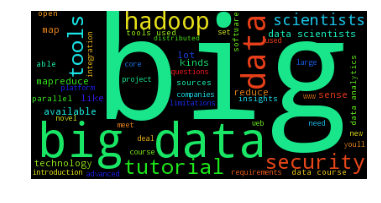

v v v v 	Topic #1	v v v v v

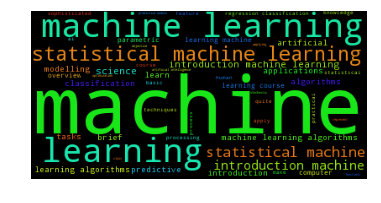

v v v v 	Topic #2	v v v v v

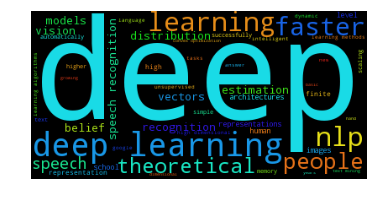

v v v v 	Topic #3	v v v v v

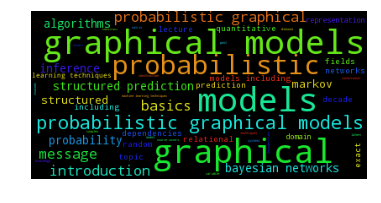

v v v v 	Topic #4	v v v v v

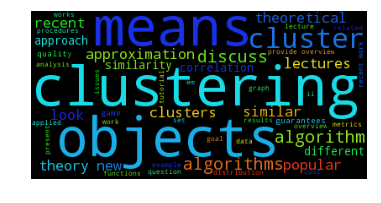

v v v v 	Topic #5	v v v v v

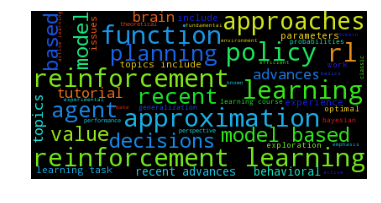

v v v v 	Topic #6	v v v v v

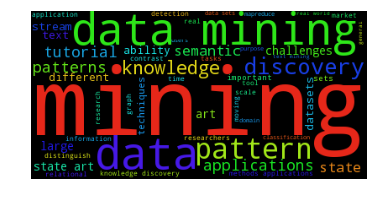

v v v v 	Topic #7	v v v v v

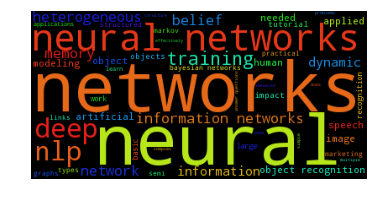

v v v v 	Topic #8	v v v v v

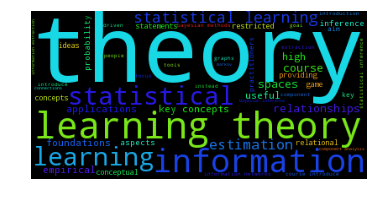

v v v v 	Topic #9	v v v v v

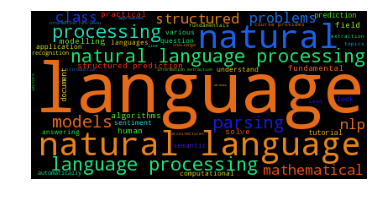

v v v v 	Topic #10	v v v v v

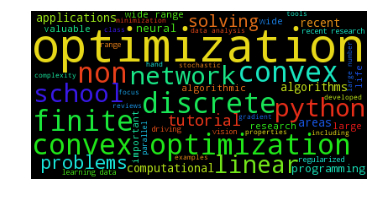

v v v v 	Topic #11	v v v v v

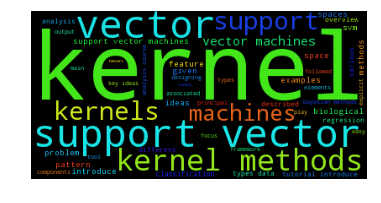

v v v v 	Topic #12	v v v v v

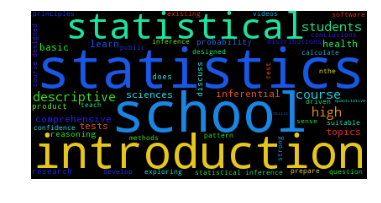

v v v v 	Topic #13	v v v v v

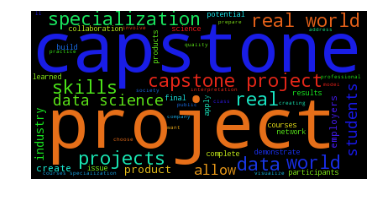

v v v v 	Topic #14	v v v v v

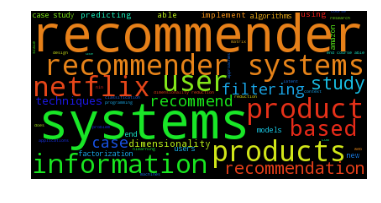

v v v v 	Topic #15	v v v v v

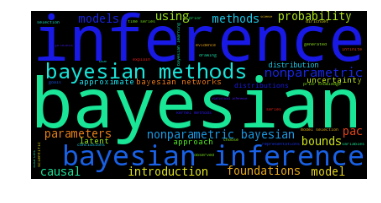

v v v v 	Topic #16	v v v v v

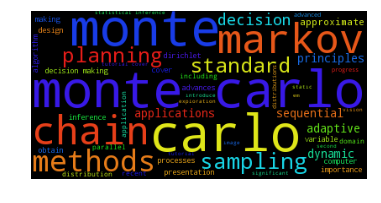

v v v v 	Topic #17	v v v v v

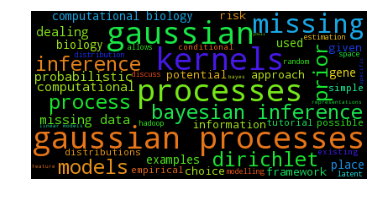

v v v v 	Topic #18	v v v v v

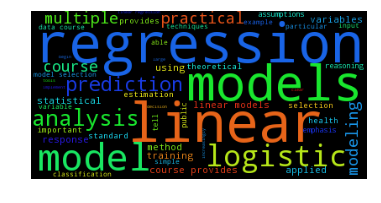

v v v v 	Topic #19	v v v v v

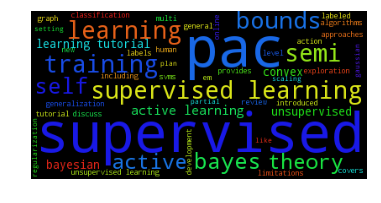

v v v v 	Topic #20	v v v v v

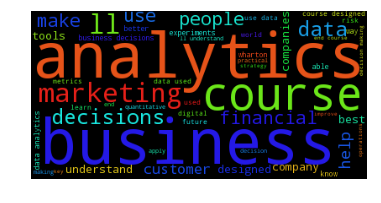

v v v v 	Topic #21	v v v v v

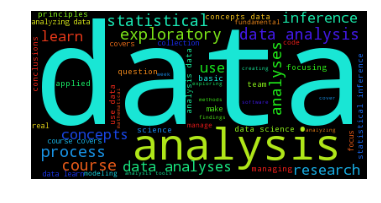

v v v v 	Topic #22	v v v v v

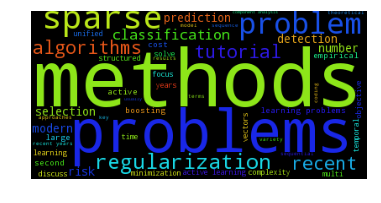

v v v v 	Topic #23	v v v v v

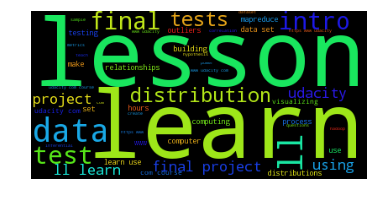

v v v v 	Topic #24	v v v v v

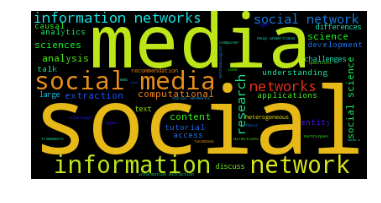

v v v v 	Topic #25	v v v v v

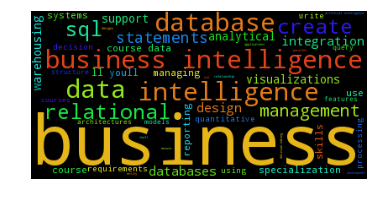

v v v v 	Topic #26	v v v v v

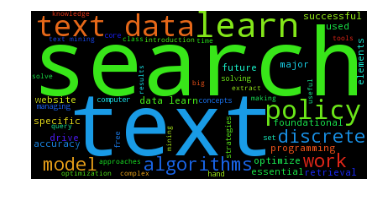

v v v v 	Topic #27	v v v v v

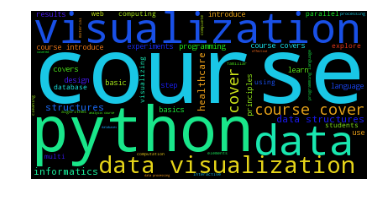

v v v v 	Topic #28	v v v v v

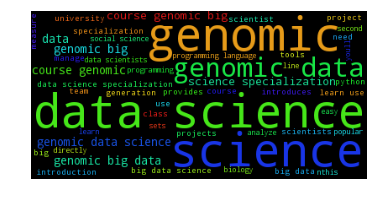

v v v v 	Topic #29	v v v v v

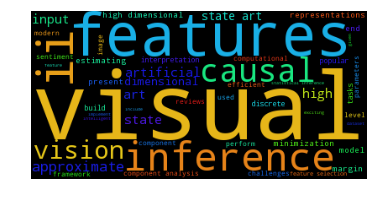

In [20]:
from sklearn.decomposition import NMF
n_topics = 30
n_top_words = 50
nmf = NMF(n_components=n_topics, random_state=1).fit(tfidf)

feature_names = words
topic_dict = dict()
for topic_idx, topic in enumerate(nmf.components_):
    print("v v v v \tTopic #%d\t" % topic_idx, end='v v v v v')
    topic_top_words = [feature_names[i]
                    for i in topic.argsort()[:-n_top_words - 1:-1]]
    topic_top_words_vals = sorted(topic.ravel(), reverse=True)[:n_top_words]
    text_freq = zip(topic_top_words, topic_top_words_vals)
    wordcloud(text_freq)
    topic_top_words = ", ".join(topic_top_words)
    #print(topic_top_words)
    topic_dict[topic_idx] = text_freq

Populating the interactive namespace from numpy and matplotlib


`%matplotlib` prevents importing * from pylab and numpy


Loading BokehJS ...

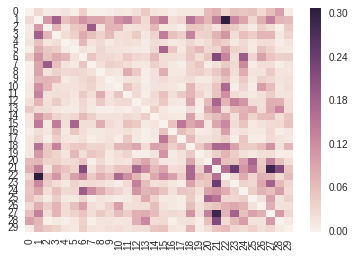

In [21]:
%run basics.ipynb
transformed = nmf.transform(tfidf)
df_title_topic = pd.DataFrame(columns=['title'], data=df['title'].values)
df_title_topic['topic id'] = transformed.argmax(axis=1)
plot_topic_coocurrence(transformed)

In [22]:
data = list()
for r in transformed:
    for idx, i in enumerate(sorted(r, reverse=True)):
        data.append((idx, i))

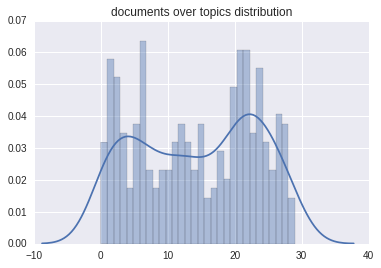

In [23]:
dist_df = pd.DataFrame(columns=['pos', 'val'], data=data)
sns.distplot(transformed.argmax(axis=1).flatten(), bins=n_topics)
plt.title('documents over topics distribution')
plt.show()

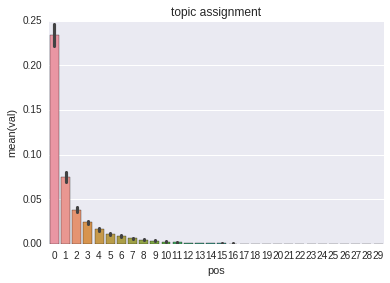

In [24]:
sns.barplot(x='pos', y='val', data=dist_df)
plt.title('topic assignment')
plt.show()

In [25]:
dependecies = list()
#dep_range = range(9, 12)
#for r in transformed:
#    t_id, t_val = zip(*sorted(enumerate(r), reverse=True, key=itemgetter(1)))
#    
#    for i in dep_range:
#        dependecies.append((t_id[0], t_id[i], t_val[0] - t_val[i]))
#print(len(dependecies))
th = 0.1
for t1 in range(transformed.shape[1]):
    for t2 in range(transformed.shape[1]):
        if t1 != t2:
            for i, j in transformed[:, [t1, t2]]:
                if i > th and j > th:
                    dependecies.append((t1, t2, i * np.log(j + 0.000000001)))

In [26]:
dependecies = pd.DataFrame(columns=['topic', 'dependency', 'diff2top'], data=dependecies)
pvt = pd.pivot_table(data=dependecies, index='topic', columns='dependency', values='diff2top', aggfunc=lambda x: -1. * np.sum(x))
pvt_vals = pvt.fillna(0).values
for i in range(pvt_vals.shape[0]):
    for j in range(pvt_vals.shape[1]):
        if i == j:
            pvt_vals[i,j] = 0
        elif pvt_vals[i, j] > pvt_vals[j, i]:
            pvt_vals[i, j] = 0
pvt[:] = pvt_vals

In [27]:
pvt.head(2)

dependency,0,1,2,3,5,6,7,8,9,10,...,20,21,22,23,24,25,26,27,28,29
topic,,,,,,,,,,,,,,,,,,,,,
0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,...,0.0,0.0,0.000000,0.164414,0.0,0.0,0.0,0.000000,0.0,0.0
1,0.0,0.0,0.0,0.701537,0.0,0.191896,0.209194,0.223366,0.0,0.459789,...,0.0,0.0,0.933799,0.000000,0.0,0.0,0.0,0.489629,0.0,0.0


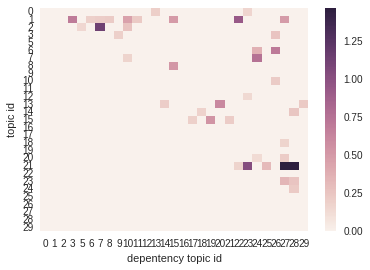

In [28]:
sns.heatmap(pvt)
plt.ylabel('topic id')
plt.xlabel('depentency topic id')
plt.show()

In [29]:
mean_df = pd.DataFrame(pvt.mean(axis=1))
mean_df['topic'] = map(lambda x: topic_dict[x], mean_df.index)
mean_df.sort_values(by=0)

,0,topic
topic,,
29,0.000000,"[(visual, 1.02201601489), (features, 0.8937408..."
28,0.000000,"[(data science, 0.848673859182), (science, 0.7..."
19,0.000000,"[(supervised, 0.908043124234), (pac, 0.7372122..."
11,0.000000,"[(kernel, 1.13474623209), (support vector, 0.6..."
16,0.000000,"[(monte carlo, 1.00992920933), (carlo, 1.00992..."
22,0.000000,"[(methods, 0.807354346237), (problems, 0.69253..."
9,0.000000,"[(language, 1.53854498933), (natural language,..."
5,0.000000,"[(reinforcement learning, 1.31764516229), (rei..."
25,0.000000,"[(business, 0.839808761072), (business intelli..."


In [30]:
topic_dep = pd.DataFrame(columns=['dep'], data=pvt.idxmax(axis=1))
topic_dep['dep val'] = pvt.max(axis=1)
topic_dep.head(2)

,dep,dep val
topic,,
0,13,0.196960
1,22,0.933799


--------------------------------------------------------------------------------
1.47218246705
topic id: 21 prereq topic id: 27


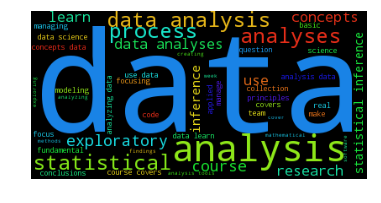

^^^^^^^


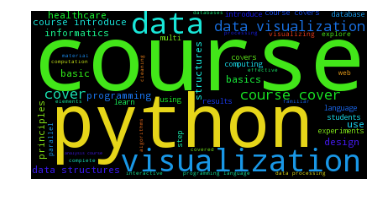

--------------------------------------------------------------------------------
1.14222788169
topic id: 2 prereq topic id: 7


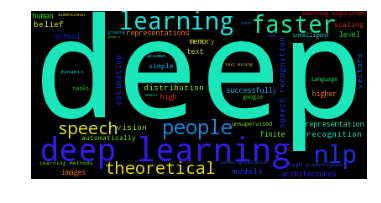

^^^^^^^


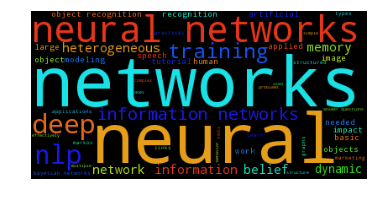

--------------------------------------------------------------------------------
0.933799043688
topic id: 1 prereq topic id: 22


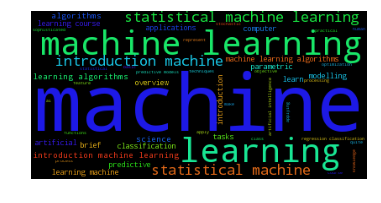

^^^^^^^


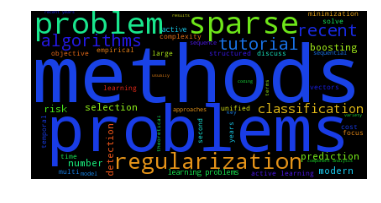

--------------------------------------------------------------------------------
0.751733120828
topic id: 7 prereq topic id: 24


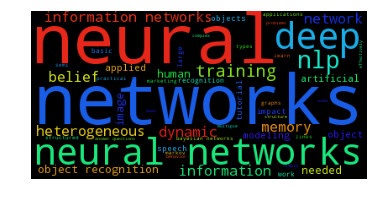

^^^^^^^


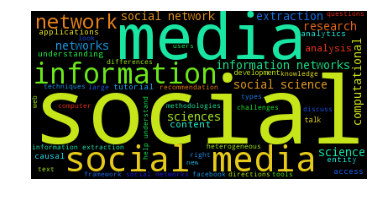

--------------------------------------------------------------------------------
0.701915846076
topic id: 6 prereq topic id: 26


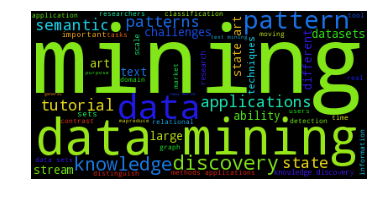

^^^^^^^


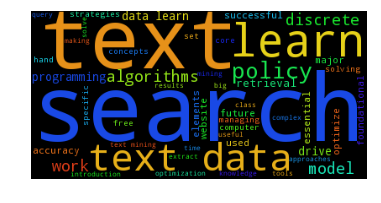

--------------------------------------------------------------------------------
0.60915860036
topic id: 13 prereq topic id: 20


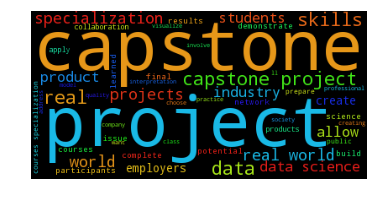

^^^^^^^


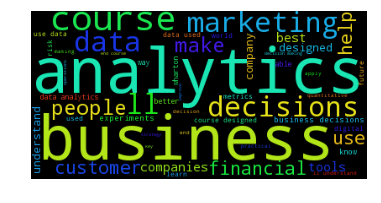

--------------------------------------------------------------------------------
0.536191391088
topic id: 15 prereq topic id: 19


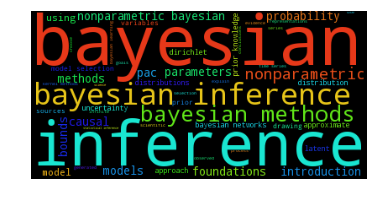

^^^^^^^


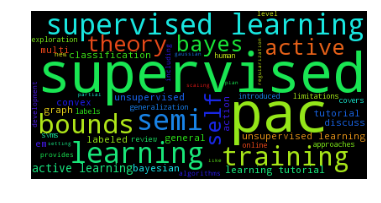

--------------------------------------------------------------------------------
0.516484294842
topic id: 8 prereq topic id: 15


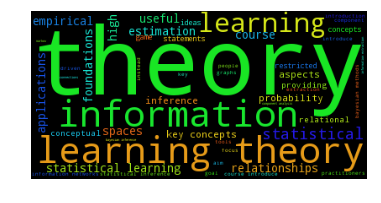

^^^^^^^


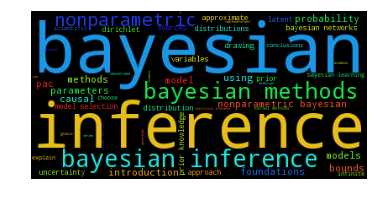

--------------------------------------------------------------------------------
0.336248828422
topic id: 23 prereq topic id: 27


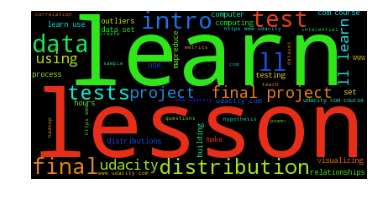

^^^^^^^


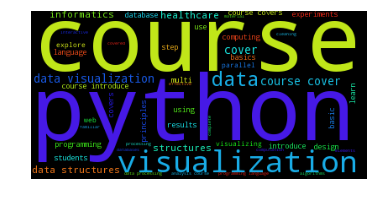

--------------------------------------------------------------------------------
0.255331965571
topic id: 3 prereq topic id: 26


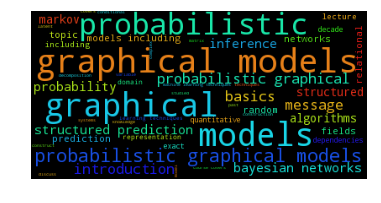

^^^^^^^


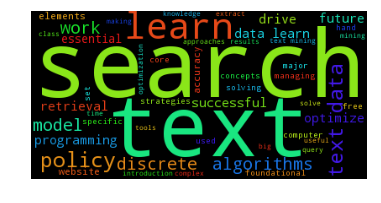

--------------------------------------------------------------------------------
0.249250872383
topic id: 14 prereq topic id: 28


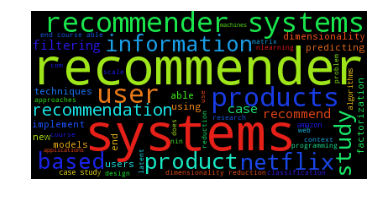

^^^^^^^


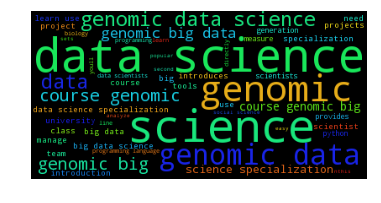

--------------------------------------------------------------------------------
0.228213054276
topic id: 24 prereq topic id: 28


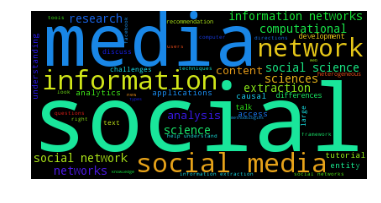

^^^^^^^


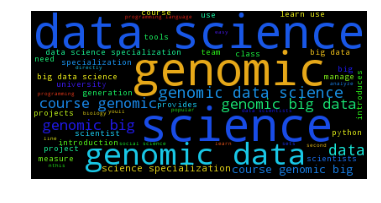

--------------------------------------------------------------------------------
0.220245472024
topic id: 10 prereq topic id: 26


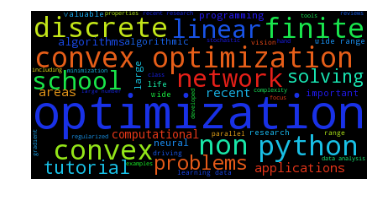

^^^^^^^


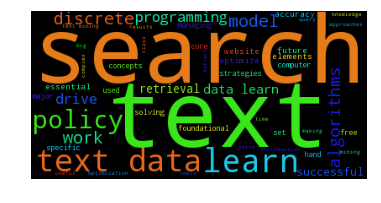

--------------------------------------------------------------------------------
0.214491996423
topic id: 20 prereq topic id: 27


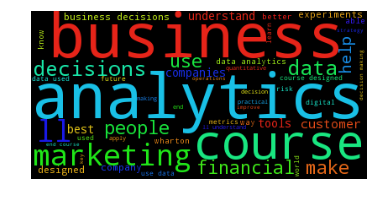

^^^^^^^


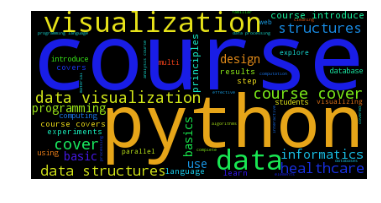

--------------------------------------------------------------------------------
0.196959610554
topic id: 0 prereq topic id: 13


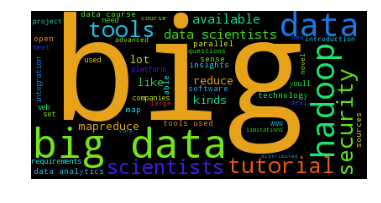

^^^^^^^


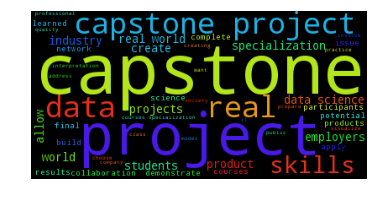

--------------------------------------------------------------------------------
0.177051232382
topic id: 18 prereq topic id: 27


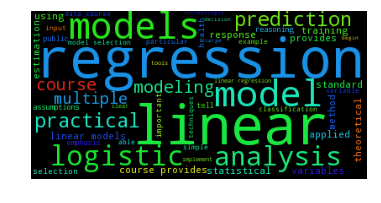

^^^^^^^


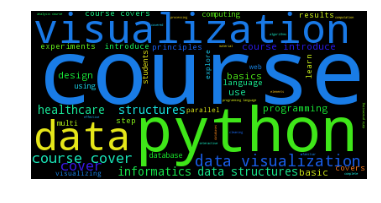

--------------------------------------------------------------------------------
0.140822582841
topic id: 12 prereq topic id: 23


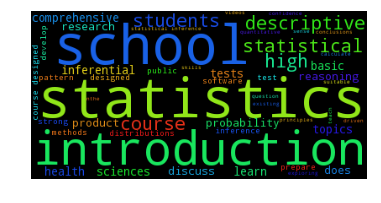

^^^^^^^


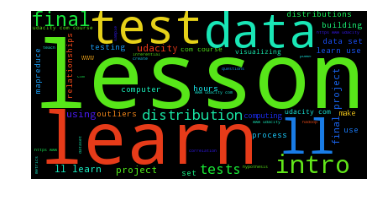

In [31]:
topic_dep.sort_values(by='dep val', ascending=False, inplace=True)
topic_dep['topic'] = map(lambda x: topic_dict[x], topic_dep.index)
topic_dep['topic dep.'] = map(lambda x: np.nan if x not in topic_dict else topic_dict[x], topic_dep['dep'])
prereq_list = list()
for idx, (dep_val, topic, dep, dep_id) in topic_dep[['dep val', 'topic', 'topic dep.', 'dep']].iterrows():
    if dep_val > .01:
        print('-'*80)
        print(dep_val)
        print('topic id:', idx, 'prereq topic id:', dep_id)
        prereq_list.append((idx, dep_id))
        wordcloud(topic)
        print('^^^^^^^')
        wordcloud(dep)

In [18]:
%run basics.ipynb
tmp = df_title_topic.copy()
tmp['title'] = tmp['title'].apply(lambda x: x.replace(' - VideoLectures.NET', ""))
pg = get_prereq_graph(tmp.values, prereq_list)

Populating the interactive namespace from numpy and matplotlib


`%matplotlib` prevents importing * from pylab and numpy


Loading BokehJS ...

<Graph object, directed, with 345 vertices and 2430 edges at 0x7f04bb31f710>


In [19]:
dep_df = dependecies.groupby(by=('topic', 'dependency'),as_index=False).mean().sort_values(by='diff2top')
dep_df['topic'] = map(lambda x: topic_dict[x], dep_df['topic'])
dep_df['dependency'] = map(lambda x: topic_dict[x], dep_df['dependency'])
dep_df

,topic,dependency,diff2top
209,"[(nlp, 1.1689888501), (memory, 0.563198812011)...","[(networks, 1.93076584273), (information netwo...",-1.168504
210,"[(nlp, 1.1689888501), (memory, 0.563198812011)...","[(problems, 0.667711275417), (classification, ...",-0.950458
184,"[(information, 1.26593841342), (theory, 0.3859...","[(social, 1.96952615696), (media, 0.7314251043...",-0.929141
136,"[(sparse, 1.11332950612), (methods, 0.77525123...","[(machine, 1.6542581555), (machine learning, 1...",-0.867860
208,"[(nlp, 1.1689888501), (memory, 0.563198812011)...","[(language, 0.975891611941), (natural language...",-0.799459
222,"[(course covers, 0.604899832945), (covers, 0.5...","[(pattern, 1.40725894329), (framework, 0.39234...",-0.738735
238,"[(scale, 0.401364851238), (graph, 0.3957897568...","[(information, 1.26593841342), (theory, 0.3859...",-0.709198
216,"[(course covers, 0.604899832945), (covers, 0.5...","[(machine, 1.6542581555), (machine learning, 1...",-0.698358
123,"[(gaussian processes, 1.43784764111), (gaussia...","[(bayesian, 3.24735351214), (bayesian inferenc...",-0.696071
149,"[(analytics, 0.960458070505), (business, 0.756...","[(business, 0.865504734116), (business intelli...",-0.667340
